Run Summary: {'_wandb': {'runtime': 43301}, 'test/avg_corr': 0.6069046258926392, 'test/avg_corr_left_out': 0.6069046258926392, 'test/corr_per_neuron': '...', 'val/corr': 0.4190232753753662}
Run Config: {'layers': 5, 'lr_init': 0.005, 'fine_tune': 'core', 'batch_size': 32, 'input_kern': 3, 'upsampling': 1, 'gamma_input': 0, 'hidden_kern': 9, 'gamma_hidden': 0, 'do_not_sample': True, 'depth_separable': False, 'hidden_channels': 4, 'init_sigma_range': 0.1, 'rot_eq_batch_norm': True}
System Metrics: {'system.cpu': 6.12, 'system.memory': 14.78, 'system.disk.in': 556.92, 'system.disk.out': 8185.23, 'system.gpu.0.gpu': 88.8, 'system.gpu.0.temp': 85.87, 'system.gpu.0.memory': 6.4, 'system.network.recv': 102285201.86, 'system.network.sent': 106846877.57, 'system.disk.\\.usageGB': 1876.23, 'system.gpu.0.powerWatts': 241.96, 'system.proc.cpu.threads': 32, 'system.cpu.0.cpu_percent': 1.75, 'system.cpu.1.cpu_percent': 1.25, 'system.cpu.2.cpu_percent': 2.92, 'system.cpu.3.cpu_percent': 0.42, 'system

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb:   1 of 1 files downloaded.  


Artifact downloaded to: /project/optogenetic_experiments/artifacts/core_sd:v8


/src/neuralpredictors/neuralpredictors/layers/readouts/base.py:74: UserWarning: Use of 'gamma_readout' is deprecated. Use 'feature_reg_weight' instead. If 'feature_reg_weight' is defined, 'gamma_readout' is ignored
  warnings.warn(
/project/readout.py:323: UserWarning: sigma is sampled from uniform distribution, instead of a fixed value. Consider setting fixed_sigma to True
  warnings.warn(


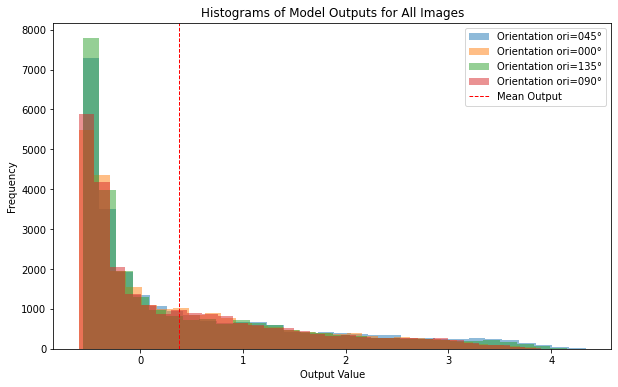

In [1]:
from LSV1M_training.load_best_model import model
from PIL import Image
import numpy as np
import torch
import torchvision.transforms as transforms
import os
import matplotlib.pyplot as plt

# Check if GPU is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Directory containing the images
image_dir = '/CSNG/baroni/mozaik-models/Images/gratings/'

# Get all image paths in the directory
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.endswith('.png')]

pixel_min = -1.8347 # (the lowest value encountered in the data that served to train the model, serves as the black reference)
pixel_max = 2.1465  # (the highest [...] serves at white reference )

# Move the model to the device
model.to(device)

# Initialize a list to store all model outputs
all_model_outputs = []

for path in image_paths:
    # Read the image
    image = Image.open(path).convert('L')
    # Resize the image to 55x55
    resize_transform = transforms.Resize((55, 55))
    image = resize_transform(image)
    image = np.array(image)
    
    # Rescale the image to assume values between pixel_min and pixel_max
    image = (image / 255.0) * (pixel_max - pixel_min) + pixel_min

    # Convert the image to a tensor and add a batch dimension
    image_tensor = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

    # Pass the image to the model
    model_output = model(image_tensor)

    # Detach the model output from the computation graph and move it to the CPU
    model_output_cpu = model_output.detach().cpu()

    # Append the model output to the list
    all_model_outputs.append(model_output_cpu.numpy().flatten())

# Plot histograms of all model outputs in the same figure
plt.figure(figsize=(10, 6))
for i, model_output in enumerate(all_model_outputs):
    # Extract orientation from the filename assuming it's part of the filename, e.g., 'grating_45.png'
    orientation = os.path.basename(image_paths[i]).split('_')[1].split('.')[0]
    plt.hist(model_output, bins=30, alpha=0.5, label=f'Orientation {orientation}°')

# Calculate the mean of all model outputs
mean_output = np.concatenate(all_model_outputs).mean()

plt.axvline(mean_output, color='r', linestyle='dashed', linewidth=1, label='Mean Output')
plt.title('Histograms of Model Outputs for All Images')
plt.xlabel('Output Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [2]:
file = '/CSNG/baroni/mozaik-models/LSV1M/or_map_new_16x16'
import pickle

with open(file, 'rb') as f:
    data = pickle.load(f, encoding='latin1')


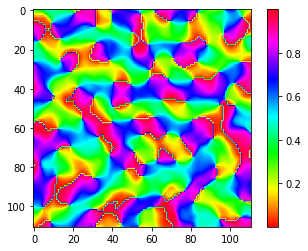

In [3]:
# Suppose this image is 16x16 degrees, but its resolution is given by image.shape[:2]
height, width = data.shape[:2]

# Calculate the pixel range for the central 5x5 degrees
central_height_start = int((height / 16) * 5.5)
central_height_end = int((height / 16) * 10.5)
central_width_start = int((width / 16) * 5.5)
central_width_end = int((width / 16) * 10.5)

# Extract the central 5x5 degree region
central_region = data[central_height_start:central_height_end, central_width_start:central_width_end]

plt.imshow(central_region, cmap='hsv')
plt.colorbar()


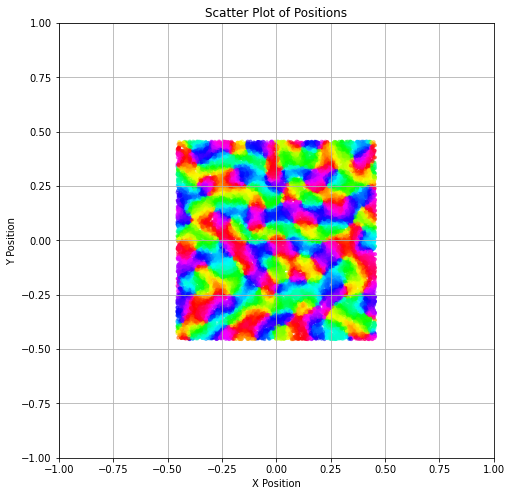

In [4]:
model.readout['all_sessions'].mu.shape

pos = model.readout['all_sessions'].mu.squeeze()[:,:2].cpu()
ori = model.readout['all_sessions'].mu.squeeze()[:,-1].cpu()
plt.figure(figsize=(10, 8))
plt.scatter(-pos[:, 1], -pos[:, 0], c=ori, marker='.', alpha=0.5, cmap='hsv')
plt.xlim(-1, 1)

plt.ylim(-1, 1)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Scatter Plot of Positions')
plt.grid(True)
plt.show()


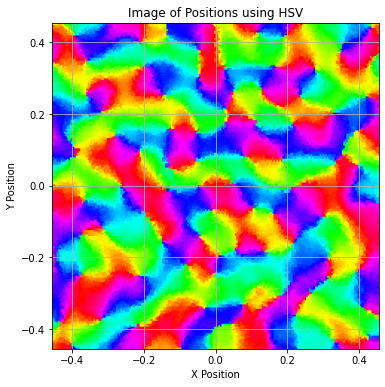

In [5]:
model.readout['all_sessions'].mu.shape

pos = model.readout['all_sessions'].mu.squeeze()[:,:2].cpu()
ori = model.readout['all_sessions'].mu.squeeze()[:,-1].cpu()

# Define the resolution of the image
resolution = 220

# Create an empty image with the given resolution
image_colors = np.zeros((resolution, resolution, 3))

# Normalize positions to fit within the image dimensions
x_min, x_max = pos[:, 1].min(), pos[:, 1].max()
y_min, y_max = pos[:, 0].min(), pos[:, 0].max()

x_normalized = -((pos[:, 1] - x_min) / (x_max - x_min) * (resolution - 1)).long()
y_normalized = -((pos[:, 0] - y_min) / (y_max - y_min) * (resolution - 1)).long()

# For each pixel in the image, find the closest point in the scatterplot
for i in range(resolution):
    for j in range(resolution):
        # Calculate the real-world coordinates of the pixel
        x_coord = -(x_min + (x_max - x_min) * j / (resolution - 1))
        y_coord = -(y_min + (y_max - y_min) * i / (resolution - 1))
        
        # Calculate distances to all points
        distances = np.sqrt((pos[:, 1] - x_coord)**2 + (pos[:, 0] - y_coord)**2)
        
        # Find the index of the closest point
        closest_point_idx = distances.argmin()
        
        # Color the pixel according to the ori value of the closest point
        image_colors[i, j] = plt.cm.hsv(ori[closest_point_idx])[:3]

# Display the image with HSV colormap
plt.figure(figsize=(8, 6))
plt.imshow(image_colors, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='hsv')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Image of Positions using HSV')
plt.grid(True)
plt.show()

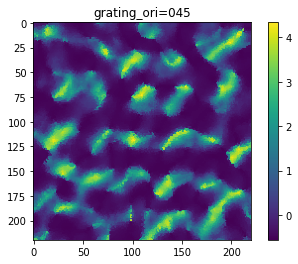

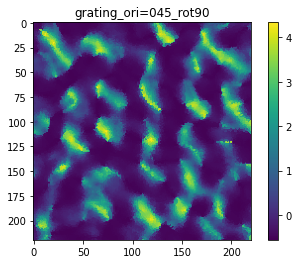

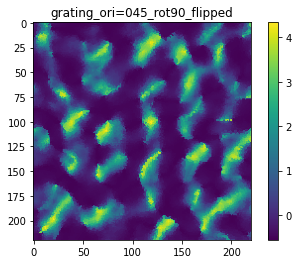

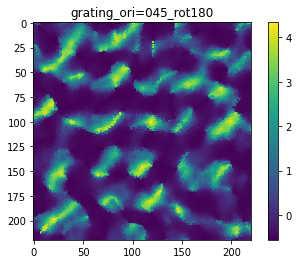

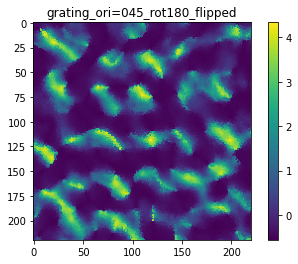

...

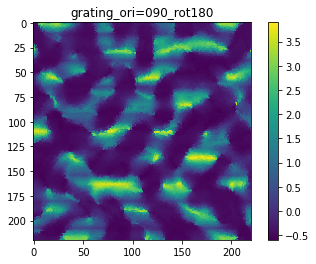

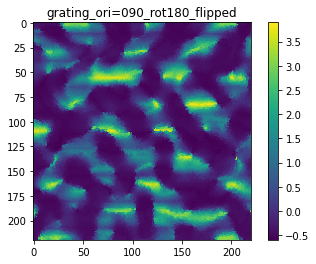

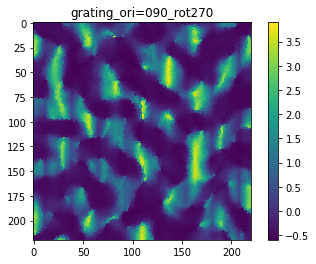

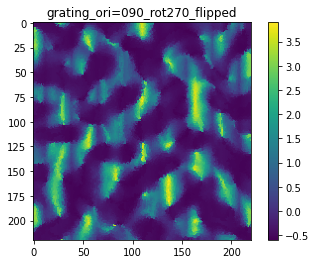

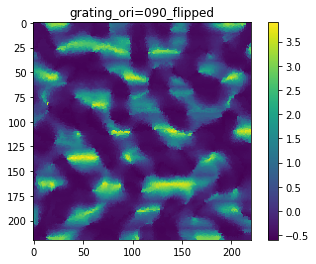

In [23]:
resp_dict = {p: resp for p, resp in zip(image_paths, all_model_outputs)}
image_dict = {}
pos = model.readout['all_sessions'].mu.squeeze()[:, :2].cpu()

# Assuming model_output is available and has been computed elsewhere in the notebook
# Define the resolution of the image
resolution = 220
# Normalize positions to fit within the image dimensions
x_min, x_max = pos[:, 1].min(), pos[:, 1].max()
y_min, y_max = pos[:, 0].min(), pos[:, 0].max()

x_normalized = -((pos[:, 1] - x_min) / (x_max - x_min) * (resolution - 1)).long()
y_normalized = -((pos[:, 0] - y_min) / (y_max - y_min) * (resolution - 1)).long()

for p, resp in resp_dict.items():
    # Create an empty greyscale image with the given resolution
    image = np.zeros((resolution, resolution))
    # For each pixel in the image, find the closest point in the scatterplot
    for i in range(resolution):
        for j in range(resolution):
            # Calculate the real-world coordinates of the pixel
            x_coord = -(x_min + (x_max - x_min) * j / (resolution - 1))
            y_coord = -(y_min + (y_max - y_min) * i / (resolution - 1))
            
            # Calculate distances to all points
            distances = np.sqrt((pos[:, 1] - x_coord)**2 + (pos[:, 0] - y_coord)**2)
            
            # Find the index of the closest point
            closest_point_idx = distances.argmin()

            # Set the pixel value according to the model_output value of the closest point
            image[i, j] = resp[closest_point_idx]
    
    p = p.split('/')[-1].split('.')[0]
    
    # Save the original image
    image_dict[p] = image

    # Save rotated versions of the image
    for angle in [90, 180, 270]:
        rotated_image = np.rot90(image, k=angle // 90)
        image_dict[f"{p}_rot{angle}"] = rotated_image

        # Save flipped version of the rotated image
        flipped_rotated_image = np.flipud(rotated_image)
        image_dict[f"{p}_rot{angle}_flipped"] = flipped_rotated_image

    # Save flipped version of the original image
    flipped_image = np.flipud(image)
    image_dict[f"{p}_flipped"] = flipped_image

for p, image in image_dict.items():
    plt.imshow(image)
    plt.title(p)
    plt.colorbar()
    plt.show()


In [24]:
for p, image in image_dict.items():
    folder_path = 'Images_for_optostim'
    os.makedirs(folder_path, exist_ok=True)
    file_name = p.split('.')[0] + '.npy'
    path = os.path.join(folder_path, file_name)
    np.save(path, np.clip(image, 0, 3))
    print(f"Saved {file_name} in {folder_path}")

Saved grating_ori=045.npy in Images_for_optostim
Saved grating_ori=045_rot90.npy in Images_for_optostim
Saved grating_ori=045_rot90_flipped.npy in Images_for_optostim
Saved grating_ori=045_rot180.npy in Images_for_optostim
Saved grating_ori=045_rot180_flipped.npy in Images_for_optostim
Saved grating_ori=045_rot270.npy in Images_for_optostim
Saved grating_ori=045_rot270_flipped.npy in Images_for_optostim
Saved grating_ori=045_flipped.npy in Images_for_optostim
Saved grating_ori=000.npy in Images_for_optostim
Saved grating_ori=000_rot90.npy in Images_for_optostim
Saved grating_ori=000_rot90_flipped.npy in Images_for_optostim
Saved grating_ori=000_rot180.npy in Images_for_optostim
Saved grating_ori=000_rot180_flipped.npy in Images_for_optostim
Saved grating_ori=000_rot270.npy in Images_for_optostim
Saved grating_ori=000_rot270_flipped.npy in Images_for_optostim
Saved grating_ori=000_flipped.npy in Images_for_optostim
Saved grating_ori=135.npy in Images_for_optostim
Saved grating_ori=135_r

In [21]:
np.clip(resp, 0, 3)

array([0.       , 2.9066527, 0.       , ..., 0.       , 1.4980878,
       0.       ], dtype=float32)

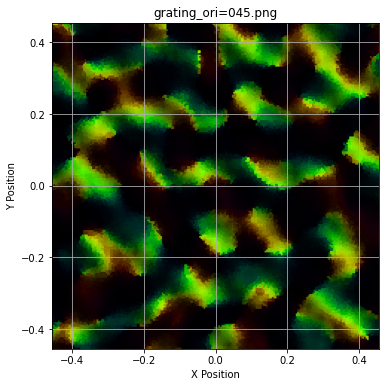

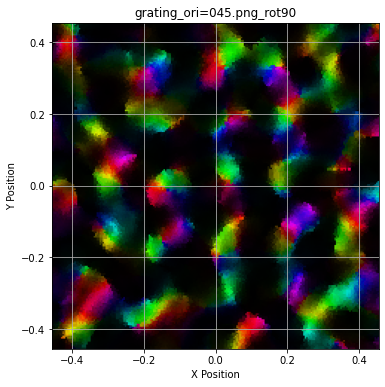

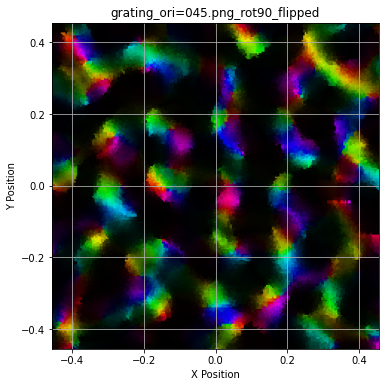

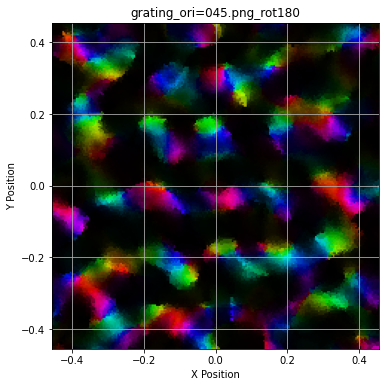

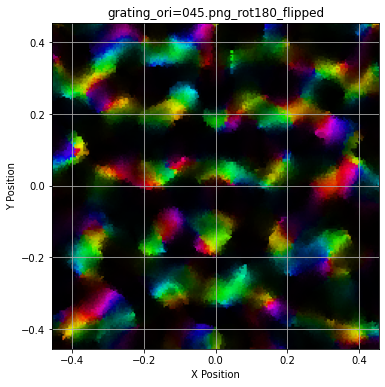

...

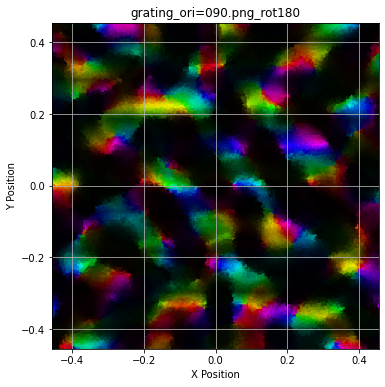

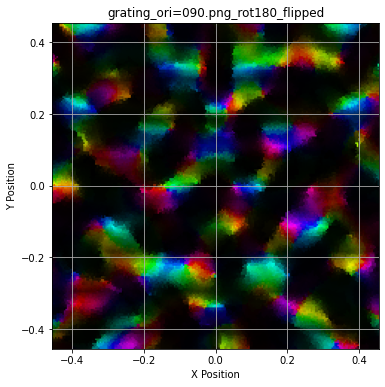

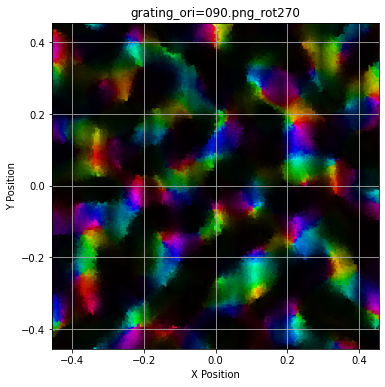

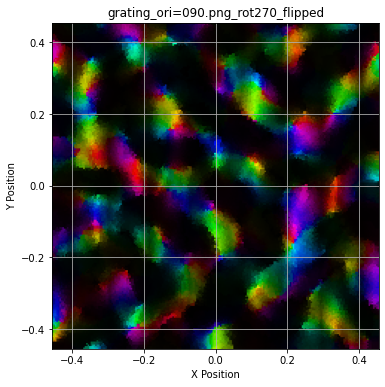

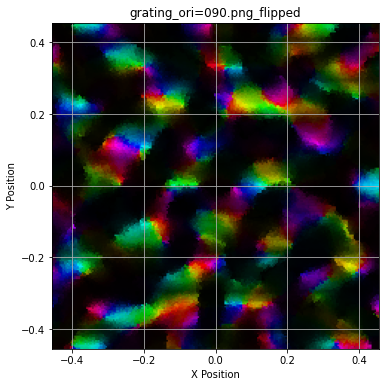

In [220]:
# Assuming image_colors and image_response are already defined and have the same resolution
import matplotlib

for p, image_response in image_dict.items():

    # Normalize the im
    # age_response to be in the range [0, 1]
    image_response_normalized = (image_response - image_response.min()) / (image_response.max() - image_response.min())

    # Convert the RGB image to HSV to modify the luminosity
    image_hsv = matplotlib.colors.rgb_to_hsv(image_colors)

    # Modify the V (value) channel of the HSV image according to the normalized image_response
    image_hsv[:, :, 2] = image_response_normalized

    # Convert the HSV image back to RGB
    image_combined = matplotlib.colors.hsv_to_rgb(image_hsv)

    # Display the combined image
    plt.figure(figsize=(8, 6))
    plt.imshow(image_combined, origin='lower', extent=[x_min, x_max, y_min, y_max])
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.title(p)
    plt.grid(True)
    plt.show()